# Wstęp do Uczenia Maszynowego PD1 (Eksploracja danych)
## Kacper Kurowski

Zacznijmy od wczytania paczek i pobrania danych

In [1]:

import pandas as pd
import numpy as np

from sklearn.datasets import load_boston
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
data =  pd.DataFrame(pd.read_json( 'https://api.apispreadsheets.com/api/dataset/forest-fires/',
                    orient = 'split'))

order_by_day = ["mon","tue","wed","thu","fri","sat","sun"]
order_by_month = ["jan", "feb", "mar", "apr", "may", "aug", "jun","jul", "sep", "oct", "nov", "dec"]

Wyświetlmy wpierw histogramy zmiennych

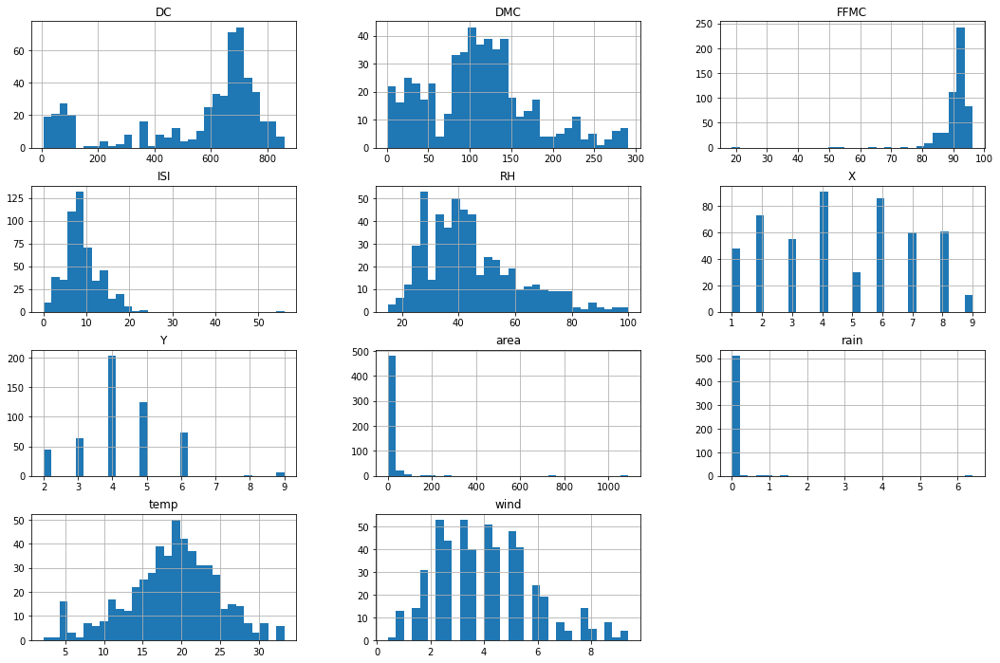

In [3]:
data.hist(figsize=(18, 12), bins=30)
plt.show()

no, nie wszystkich, bo jeszcze mamy inne, np. day czy month:

In [4]:
data.columns

Index(['X', 'Y', 'month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH',
       'wind', 'rain', 'area'],
      dtype='object')

Możemy również sprawdzić, czy histogramy wyglądają inaczej, gdy pożar rzeczywiście miał miejscce, tzn. gdy zmienna area>0:

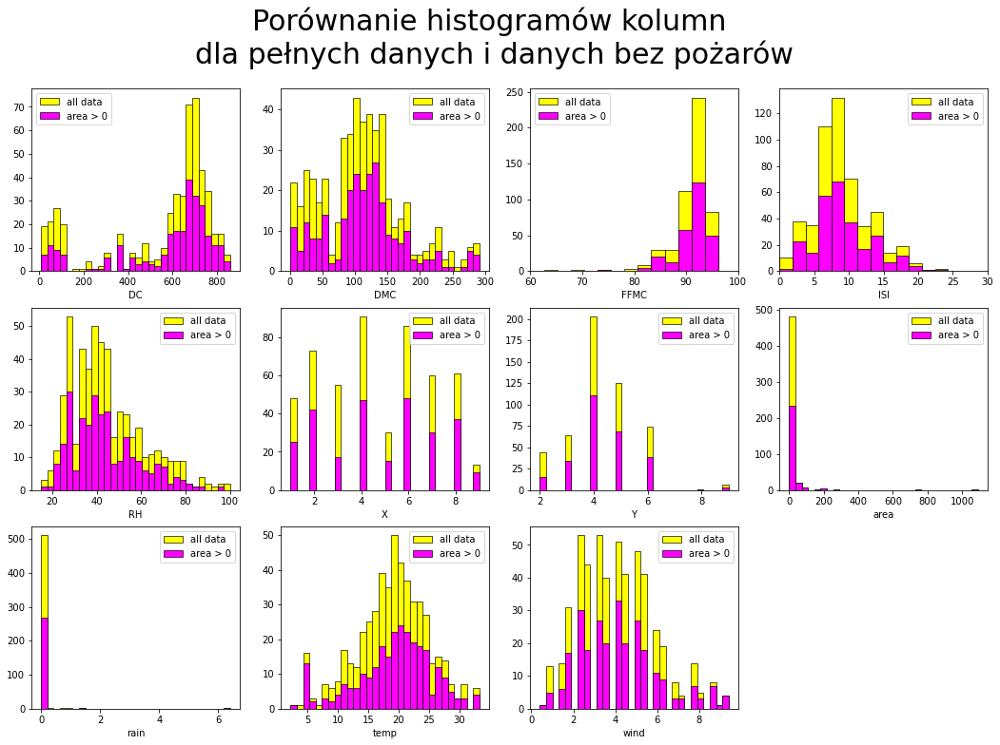

In [5]:
data_tmp = pd.DataFrame(data)
data_tmp["exclude_not_fire"] = "all data"
data_tmp2 = pd.DataFrame(data[data["area"] > 0])
data_tmp2["exclude_not_fire"] = "not fires excluded"

merged = pd.concat([data_tmp, data_tmp2])

columns_to_compare = ["DC", "DMC", "FFMC", "ISI", "RH", "X", "Y", "area", "rain", "temp", "wind"]

f = plt.figure( figsize=(18, 12))
f.suptitle("Porównanie histogramów kolumn \ndla pełnych danych i danych bez pożarów", fontsize = 30)
for i in range(1, 12):
    ax = plt.subplot(3, 4, i)
    g = sns.histplot( data = merged, ax = ax,
                     x = columns_to_compare[i-1],
                     hue = "exclude_not_fire",
                     bins = 30,
                     palette = ["magenta", "yellow"],
                     hue_order = ["not fires excluded","all data"],
                     alpha=1
                    ) 
    #g.legend_.remove()
    plt.legend(["all data", "area > 0"], loc = "best")
    ax.set_ylabel('') 
    # Usuwanie "outlierów" w celu poprawienia widoczności histogramu
    if columns_to_compare[i-1] == "FFMC":
        plt.xlim(60, 100)
    if columns_to_compare[i-1] == "ISI":
        plt.xlim(0, 30)
        
     
plt.show()

Zmiana ta wpływa na zmienną temp, która przesunęła się nieco w prawo - można stąd przypuszczać, że pomiary area=0 częściej odbywały się, gdy temperatura była stosunkowo niska, więc ich brak, gdy temp startowała jako zmienna z rozkładem prawie normalnym, stała sie skośna.

Brak zauważalnych zmian w zmiennych X i Y sugeruje, że pomiary odbywają się regularnie w odpowiednich regionach - niezależnie, czy pożar był, czy nie.

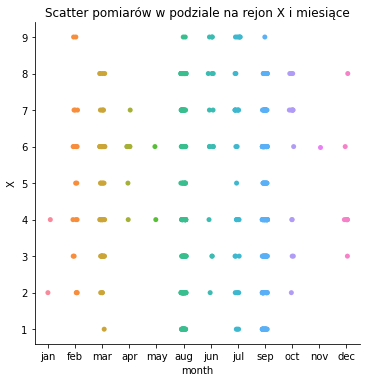

In [6]:
sns.catplot( data = data, y = "X", x = "month", order = order_by_month)
plt.title("Scatter pomiarów w podziale na rejon X i miesiące")
plt.show()

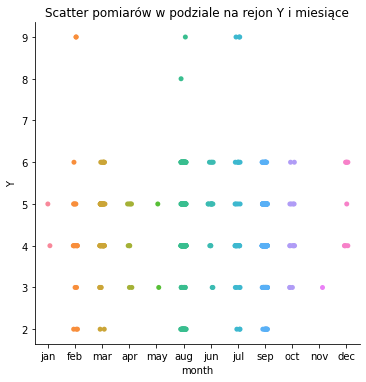

In [7]:
sns.catplot( data = data, y = "Y", x = "month", order = order_by_month)
plt.title("Scatter pomiarów w podziale na rejon Y i miesiące")
plt.show()

możemy jednak zauważyć, że o ile pomiar może niekoniecznie zależy od wystąpienia pożaru, to jednak nie wszędzie pomiary były wykonywane w każdym miesiącu. 

Możemy następnie sprawdzić, czy dni wpływają na uzyskiwane dane dotyczące pożarów.

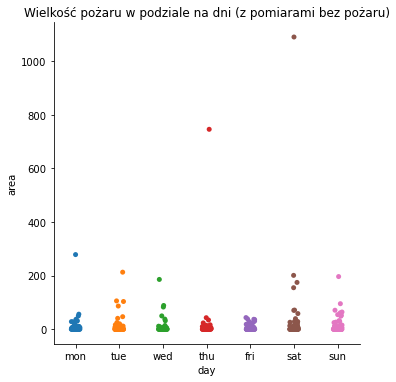

In [8]:
sns.catplot( data = data, y = "area", x = "day", order = order_by_day)
plt.title("Wielkość pożaru w podziale na dni (z pomiarami bez pożaru)")
plt.show()

Możemy zauważyć, że najgorsze pożary zostały zarejestrowane w czwartek i sobotę. Możemy również stwierdzić, że w czwartki i piątki (oprócz jednego silnego cczwartkowego pożaru), rejestrowano nie za wiele pożarów.

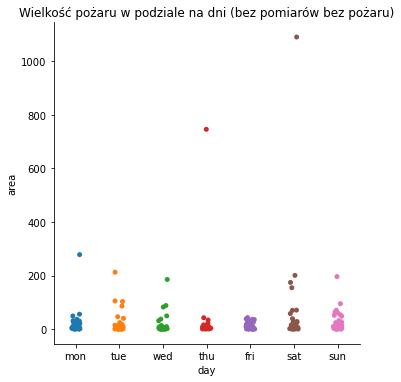

In [9]:
sns.catplot( data = data[data["area"] > 0], y = "area", x = "day", order = order_by_day)
plt.title("Wielkość pożaru w podziale na dni (bez pomiarów bez pożaru)")
plt.show()

Możemy zauważyć, że usunięcie zerowych pomiarów nie wpływa znacząco na wykres, sugerując, że każdego dnia było również wiele bardzo niewielkich (ze względu na area) pomiarów.

### Miesiące
Przejdźmy następnie do analizowania pożarów względem miesiąca

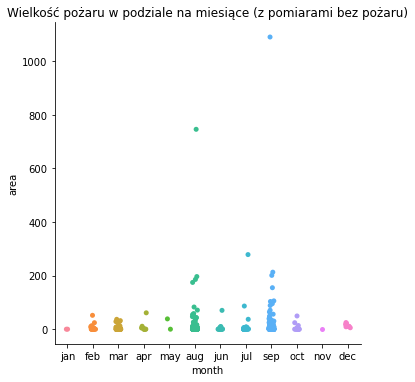

In [10]:
sns.catplot( data = data, y = "area", x = "month", order = order_by_month)
plt.title("Wielkość pożaru w podziale na miesiące (z pomiarami bez pożaru)")
plt.show()

Nietrudno zauważyć, że w miesiącach zimowych pożary praktycznie nie były rejestrowane, natomiast szczególnie w letnich, były już znacznie częstsze

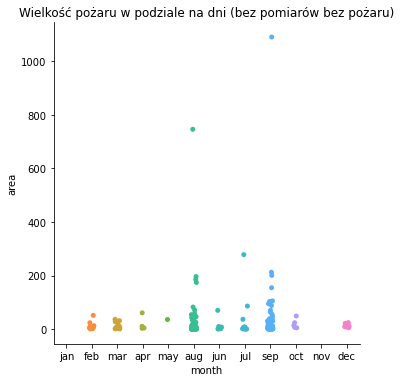

In [11]:
sns.catplot( data = data[data["area"] > 0], y = "area", x = "month", order = order_by_month)
plt.title("Wielkość pożaru w podziale na dni (bez pomiarów bez pożaru)")
plt.show()

Usunięcie zerowych pomiarów przede wszystkim skutkuje usunięciem pomiarów ze stycznia i listopada - nie zmienia jednak znacząco uzyskiwanych wykresów.

### Temperatura

Zbadamy teraz zależności pomiędzy zmienną temperatury a innymi danymi.

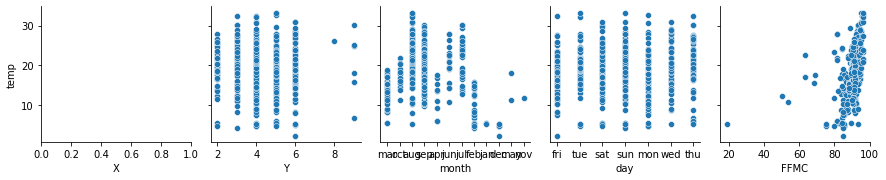

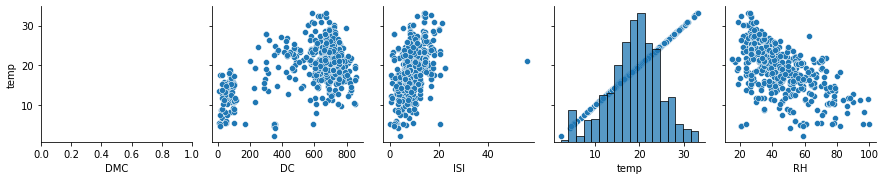

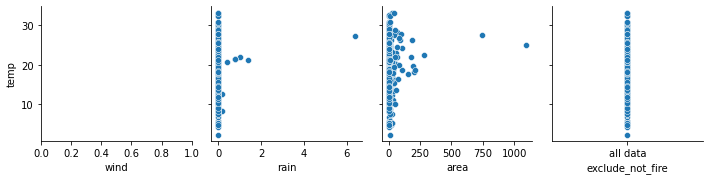

In [12]:
sns.pairplot(data, y_vars="temp", x_vars=data.columns.values[:5])
sns.pairplot(data, y_vars="temp", x_vars=data.columns.values[5:10])
sns.pairplot(data, y_vars="temp", x_vars=data.columns.values[10:])
plt.show()

Ciężko jest zauważyć jakieś w pełni widoczne zależności. Sprawdźmy jak usunięcie zerowych pomiarów zmienia wyniki. 

[]

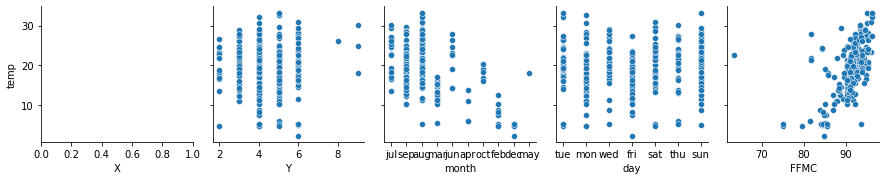

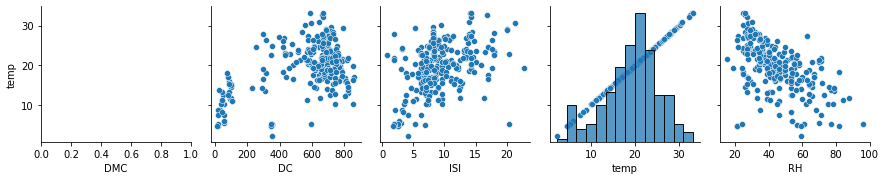

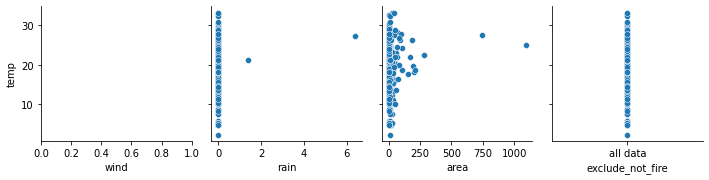

In [13]:
sns.pairplot(data[data["area"] > 0], y_vars="temp", x_vars=data.columns.values[:5])
sns.pairplot(data[data["area"] > 0], y_vars="temp", x_vars=data.columns.values[5:10])
sns.pairplot(data[data["area"] > 0], y_vars="temp", x_vars=data.columns.values[10:])
plt.plot()

To, co możemy zauważyć to to, że zmniejszyły się możliwe wartości zmiennej ISI, a zwiększyły się wartości zmiennej FFMC.
Być może zmienne te są w pewien sposób powiązane. W tym celu porównajmy ich wartości (wpierw dla całego zbioru danych).

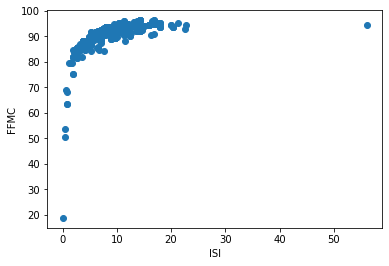

In [14]:
plt.scatter(
    x=data[["ISI"]], y=data[["FFMC"]])
plt.xlabel("ISI")
plt.ylabel("FFMC")
plt.show()

Zmienna ta zdaje się mieć związek ze zmienną FFMC typu $\text{FFMC} \propto 100-\dfrac{1}{\text{ISI}}$. Sprawdźmy, czy rzeczywiście taki jest. Należy jednak zaznaczyć, ze zmienna ISI może mieć wartości zerowe, więc dokładnie tej postaci zależność mieć nie może.

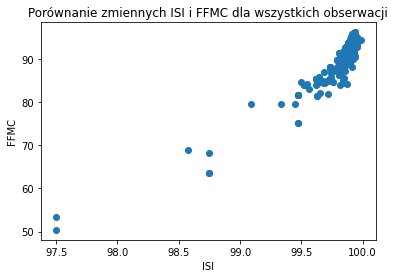

In [15]:
x = np.array((100-1/data[["ISI"]]).values).reshape(1,517)
y = data[["FFMC"]].values.reshape(1,517)

plt.scatter(x=x[0], y=y[0])
plt.title("Porównanie zmiennych ISI i FFMC dla wszystkich obserwacji")
plt.xlabel("ISI")
plt.ylabel("FFMC")
plt.show()

Przewidywana zależność mniej wiecej zachodzi - jednakże, oprócz podanego przekształcenia konieczne jest również afiniczne przekształcenie osi (przeskalowanie i przesunięcie). Spróbujmy następnie zbadać zmienną DMC. Przypomnijmy, że po usunięciu poimarów $\text{area} = 0$ zależność miałaby być bardziej widoczna - sprawdźmy, czy rzeczywiście tak jest.



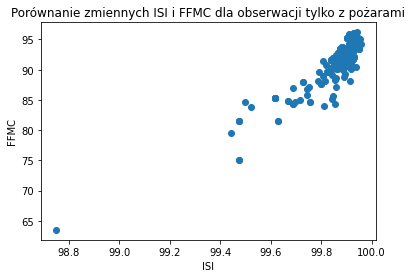

In [16]:
x = np.array((100-1/data[data["area"] > 0][["ISI"]]).values).reshape(1,270)
y = data[data["area"] > 0][["FFMC"]].values.reshape(1,270)

plt.scatter(x=x[0], y=y[0])

plt.title("Porównanie zmiennych ISI i FFMC dla obserwacji tylko z pożarami")
plt.xlabel("ISI")
plt.ylabel("FFMC")
plt.show()

Wówczas przede wszystkim widoczne jest koncentrowanie sie pomiarów w prawym górnym rogu z pewną, nieco liniową zależnością.
### DMC
Zbadajmy następnie zależność zmiennych od zmiennej DMC

[]

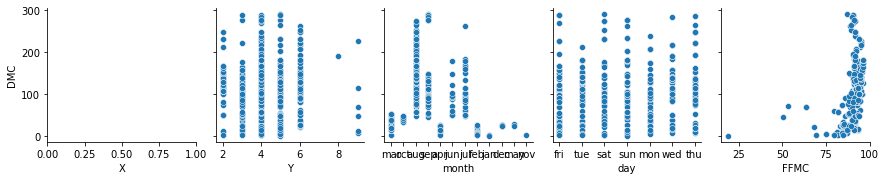

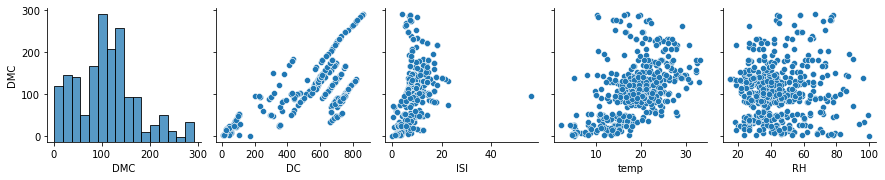

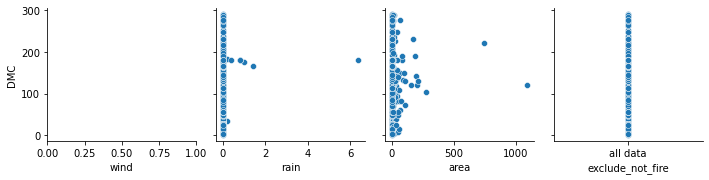

In [17]:
sns.pairplot(data, y_vars="DMC", x_vars=data.columns.values[:5])
sns.pairplot(data, y_vars="DMC", x_vars=data.columns.values[5:10])
sns.pairplot(data, y_vars="DMC", x_vars=data.columns.values[10:])
plt.plot()

Można wówczas zauważyć nieco interesujący związek ze zmienną DC - można zauważyć, że dane zdają się układać w odcinki.

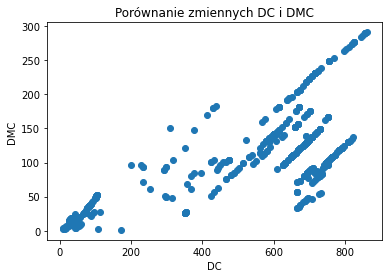

In [18]:
plt.scatter(
    x=data[["DC"]], y=data[["DMC"]])
plt.title("Porównanie zmiennych DC i DMC")
plt.xlabel("DC")
plt.ylabel("DMC")
plt.show()

Zdaje się również, że odcinki te są nachylone mniej więcej pod tym samym kotem do osi.

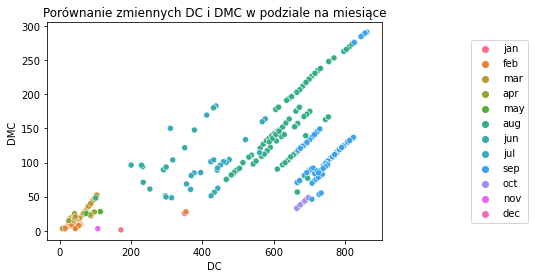

In [19]:
ax1 = sns.scatterplot(
    data = data,
    x='DC',
    y='DMC',
    hue='month',
    hue_order = order_by_month
)
plt.title("Porównanie zmiennych DC i DMC w podziale na miesiące")
ax1.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.show()

Okazuje się, że zależność odcinkowa w pewnym stopniu pozostaje nawet jakby rozróżniać dane między miesiące, to wciąż pozostają częściowe zależności odcinkowe. Co więcej, miesiące letnie charakteryzują się większymi wartościami obydwu parametrów.

Zależność pomiędzy DC i DMC może wynikać z ich definicji - DC jest ocenia wilgoci głębokich warstw organicznych, natomiast DMC ocenia wilgoci średnio głębokich warstw organicznych. Być może wilgoć może przenikać z jednej głębokości do innej przyczyniając się do regularności z wykresu

Przeprowadzenie tego typu rozróżnienia dla zmiennych ISI i FFMC nie ujawnia żadnej nowej regularności regularności.

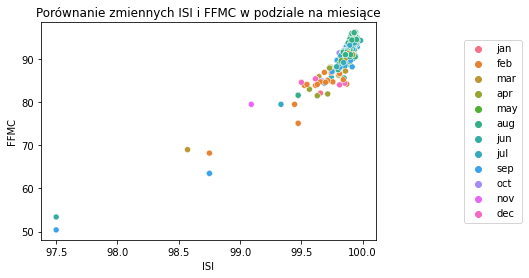

In [20]:
ax1 = sns.scatterplot(
    data = data,
    x=(100 - 1/data['ISI']),
    y='FFMC',
    hue='month',
    hue_order = order_by_month
)
plt.title("Porównanie zmiennych ISI i FFMC w podziale na miesiące")
ax1.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
plt.show()

### Eksploracja automatyczna

Na koniec pokażmy jakie wnioski możemy uzyskać korzystająć z eksploracji automatycznej.

In [21]:
from pandas_profiling import ProfileReport

In [22]:
profile = ProfileReport(data, title="Pandas Profiling Report")

In [23]:
profile.to_widgets()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,exclude_not_fire
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,all data
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,all data
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,all data
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,all data
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,all data
5,8,6,aug,sun,92.3,85.3,488.0,14.7,22.2,29,5.4,0.0,0.0,all data
6,8,6,aug,mon,92.3,88.9,495.6,8.5,24.1,27,3.1,0.0,0.0,all data
7,8,6,aug,mon,91.5,145.4,608.2,10.7,8.0,86,2.2,0.0,0.0,all data
8,8,6,sep,tue,91.0,129.5,692.6,7.0,13.1,63,5.4,0.0,0.0,all data
9,7,5,sep,sat,92.5,88.0,698.6,7.1,22.8,40,4.0,0.0,0.0,all data


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,exclude_not_fire
507,2,4,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,0.00,all data
508,1,2,aug,fri,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,0.00,all data
509,5,4,aug,fri,91.0,166.9,752.6,7.1,21.1,71,7.6,1.4,2.17,all data
510,6,5,aug,fri,91.0,166.9,752.6,7.1,18.2,62,5.4,0.0,0.43,all data
511,8,6,aug,sun,81.6,56.7,665.6,1.9,27.8,35,2.7,0.0,0.00,all data
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,all data
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,all data
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,all data
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,all data
516,6,3,nov,tue,79.5,3.0,106.7,1.1,11.8,31,4.5,0.0,0.00,all data


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,exclude_not_fire,count
0,3,4,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,0.00,all data,2
1,3,6,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,0.00,all data,2
2,4,3,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,0.00,all data,2
3,4,4,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,28.66,all data,2


In [24]:
profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Ten sposób automatycznej eskploracji pozwala na szybkie zapoznanie się z danymi od strony ich struktury. Pozwalają również na zaobserwowanie zależności między danymi w parach (również dzięki macierzy korelacji). Jednakże wszelkie te wyniki nie dają żadnej interpretacji, tylko statystyczne poszlaki zależności; wymagają zatem dodatkowej analizy.

Panel interakcji pozwala na porównywanie tylko par danych, bez możliwości dodania np. rozróżnienia ze względu na miesiące występujące w zbiorze danych. Choć podane są wartości ekstremalne (a więc można mieć sugestię co do outlierów), nie można przeanalizować wyników bez nich bez modyfikowania zbioru danych (czyli ponownej analizy na nieco innym zbiorze).

Pewną cechą tej automatyzacji jest również to, że aby zobacz raport, trzeba go całego wygenerować, niezależnie od tego, która zależność nas interesuje - zdaje się zatem, że jest to dobry pomysł na pierwsze zapoznanie się z danymi, ale niekoniecznie na gruntowną ich analizę. (Dla dużych zbiorów danych jest opcja zminimalizowania raportu, zapewne usprawniającego jego generowanie)